%config Completer.use_jedi = False

# HW2: Single-View Geometry

### Imports

In [1]:
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import cv2
import numpy as np
import warnings; warnings.simplefilter('ignore')
import matplotlib.lines as mlines

from PIL import Image

In [2]:
import copy

## Problem 3: line-line intersection

In this section we will build up some tools we will use later. 

In [3]:
# Provided plotting functions

def draw_line(x,y,xlims=[0, 15],c='b--'):
    #[x1,x2],[y1,y2]
    
    xrange = np.arange(xlims[0],xlims[1],0.1)
    A = np.vstack([x, np.ones(len(x))]).T
    k, b = np.linalg.lstsq(A, y)[0]
    plt.plot(xrange, k*xrange + b, c)
    
def newline(p1, p2):
    #p1,p2 (x,y), (x,y)
    ax = plt.gca()
    xmin, xmax = ax.get_xbound()

    if(p2[0] == p1[0]):
        xmin = xmax = p1[0]
        ymin, ymax = ax.get_ybound()
    else:
        ymax = p1[1]+(p2[1]-p1[1])/(p2[0]-p1[0])*(xmax-p1[0])
        ymin = p1[1]+(p2[1]-p1[1])/(p2[0]-p1[0])*(xmin-p1[0])

    l = mlines.Line2D([xmin,xmax], [ymin,ymax])
    ax.add_line(l)
    return l

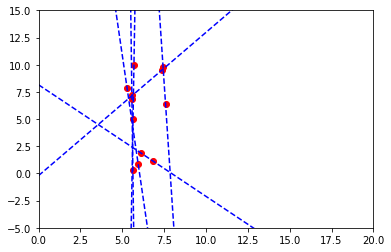

In [4]:
n = 6
P0 = np.stack((np.array([5, 5]) + 3*np.random.random(size=2) for i in range(n)))
a = np.linspace(0, 2*np.pi,n) + np.random.random(size=n)*np.pi/5.0
P1 = np.array([5 + 5*np.sin(a),5 + 5*np.cos(a)]).T

x = np.stack((P0[:,0], P0[:,1]))
y = np.stack((P1[:,0], P1[:,1]))

plt.xlim([0,20])
plt.ylim([-5,15])
plt.plot(x,y, 'ro')

for i in range(n):
    draw_line(P0[i,:], P1[i,:])


In [5]:
def intersect(P0, P1):
    """
    Input: P0 (Nx2), P1 (Nx2) start/end of all lines
    Output: 2d intersection pt
    """
    #P0 = (x1,x2), P1 = (y1,y2)
    
    
    #convert (x1,x2),(y1,y2) to (x1,y1), (x2,y2)
    
    P0_new = np.vstack((P0[:,0],P1[:,0])).T

    P1_new = np.vstack((P0[:,1],P1[:,1])).T
    
    # get line direction
    n = (P1_new - P0_new)/np.linalg.norm(P1_new - P0_new, axis=1)[:, np.newaxis]
    
    # insert code to solve for line intersection here
    N = P0.shape[0]
    d = P0.shape[1]
    
    A = np.zeros([d,d])
    B = np.zeros([d])
    for i in range(N):
        A = A + ( np.eye(d) - n[i][:,np.newaxis].dot(n[i][:,np.newaxis].T) )
        B = B + ( np.eye(d) - n[i][:,np.newaxis].dot(n[i][:,np.newaxis].T) ).dot(P0_new[i])
    
    intersection_pt = np.linalg.lstsq(A,B)[0]
    return intersection_pt

In [6]:
def intersect_pts(P0, P1):
    """
    Input: P0 (Nx2), P1 (Nx2) start/end of all lines
    Output: 2d intersection pt
    """
    #P0 = (x1,y1), P1 = (x2,y2)
    

    
    P0_new = P0

    P1_new = P1
    
    # get line direction
    n = (P1_new - P0_new)/np.linalg.norm(P1_new - P0_new, axis=1)[:, np.newaxis]
    
    # insert code to solve for line intersection here
    N = P0.shape[0]
    d = P0.shape[1]
    
    A = np.zeros([d,d])
    B = np.zeros([d])
    for i in range(N):
        A = A + ( np.eye(d) - n[i][:,np.newaxis].dot(n[i][:,np.newaxis].T) )
        B = B + ( np.eye(d) - n[i][:,np.newaxis].dot(n[i][:,np.newaxis].T) ).dot(P0_new[i])
    
    intersection_pt = np.linalg.lstsq(A,B)[0]
    return intersection_pt

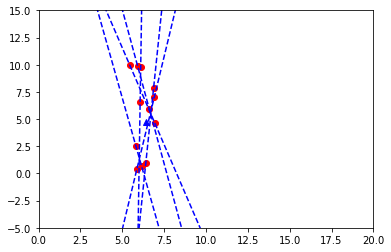

In [7]:
n = 6
P0 = np.stack((np.array([5, 5]) + 3*np.random.random(size=2) for i in range(n)))
a = np.linspace(0, 2*np.pi,n) + np.random.random(size=n)*np.pi/5.0
P1 = np.array([5 + 5*np.sin(a),5 + 5*np.cos(a)]).T
pt = intersect(P0,P1)
x = np.stack((P0[:,0], P0[:,1]))
y = np.stack((P1[:,0], P1[:,1]))

plt.xlim([0,20])
plt.ylim([-5,15])
plt.plot(x,y, 'ro')
plt.plot(pt[0],pt[1],'b^')
for i in range(n):
    draw_line(P0[i,:], P1[i,:])

# Section 2: Vanishing Point Estimation

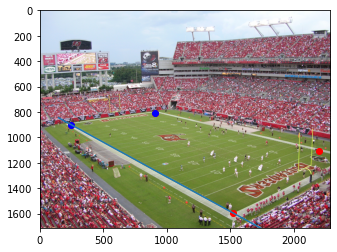

In [8]:
im = np.asarray(Image.open('data/stadium.png'))
im = (im/255).astype(np.float32)
plt.plot(245.2, 898.5,'ro')
plt.plot(1523.7, 1595.8,'ro')
plt.plot(905.3, 806.3,'ro')
plt.plot(2197, 1109,'ro')
plt.plot(905.3, 806.3,'bo')
plt.plot(245.2, 898.5,'bo')
newline([245.2, 898.5],[1523.7, 1595.8])
plt.imshow(im)

Use the provided pixel locations to solve for the vanishing points, then solve for the horizon line from the vanishing points.

In [9]:
# Load in points from points.txt


points = np.genfromtxt("data/points.txt", delimiter=',')

points_dict = []
with open('data/points_dict.txt','r') as inf:
    for line in inf:
        points_dict.append(eval(line))  
        
points_dict = points_dict[0]

In [10]:
# 3 group * 3 lines * 2 points * 2 dimension

# a numpy array that stored all the coordinates
points_np = np.zeros([3,3,2,2])

for key in points_dict:
    if key.startswith('s'):
        num= int(key[1:])
        group_num = num//10
        line_num = num%10
        points_np[group_num-1,line_num-1,0] = points_dict[key]
        points_np[group_num-1,line_num-1,1] = points_dict['e'+key[1:]]
    else:
        continue
        
        

## Problem 4

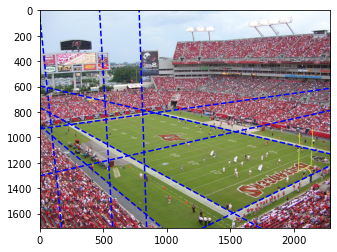

In [11]:
for i in range(points_np.shape[0]):
    for j in range(points_np.shape[1]):
        draw_line(points_np[i,j,:,0], points_np[i,j,:,1],xlims=[0, im.shape[1]])
plt.imshow(im)

## Problem 5

In [12]:

# a numpy array that stored the coordinates of all the vanishing points
intersect_np = np.zeros([3,2])

for i in range(intersect_np.shape[0]):
    intersect_np[i] = intersect(points_np[i,:,:,0],points_np[i,:,:,1])

In [13]:

# convert to integers so it can be applied to pixle coordinate
intersect_np_int = copy.deepcopy(intersect_np)
for i in range(intersect_np_int.shape[0]):
    for j in range(intersect_np_int.shape[1]):
    
        if intersect_np_int[i,j] <0:
            intersect_np_int[i,j] = np.floor(intersect_np_int[i,j])
        else:
            intersect_np_int[i,j] = np.ceil(intersect_np_int[i,j])

In [15]:
#Find the smallest and largest value, prepare for padding the original image

xy_min = np.flip(intersect_np_int.min(axis = 0))
xy_max = np.flip(intersect_np_int.max(axis = 0))

In [17]:
#padding specification

left_pad = copy.deepcopy(xy_min)
right_pad = copy.deepcopy(xy_max)

for i in range(left_pad.shape[0]):
    if left_pad[i] >= 0:
        left_pad[i] = 0
    else:
        left_pad[i] = - left_pad[i]
for j in range(right_pad.shape[0]):
    if right_pad[j] > im.shape[j]:
        right_pad[j] = -im.shape[j] + right_pad[j]
    else:
        right_pad[j] = 0

cutoff = 3000
right_pad = np.clip(right_pad,0,cutoff)
left_pad = np.clip(left_pad,0,cutoff)

right_pad += 50
left_pad += 50

right_pad=right_pad.astype(int)

left_pad=left_pad.astype(int)

In [18]:
new_img = np.pad(im,((left_pad[0],right_pad[0]),(left_pad[1],right_pad[1]),(0,0)), 'constant', constant_values=(1.))

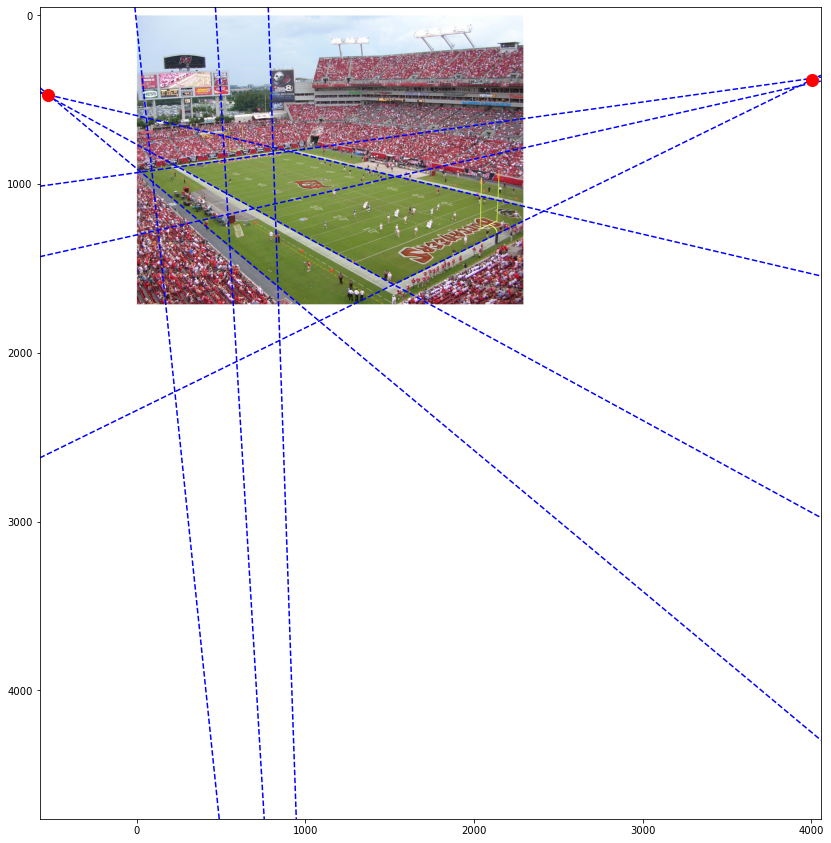

In [19]:
plt.figure(figsize=(14,50))
for i in range(points_np.shape[0]):
    for j in range(points_np.shape[1]):
        draw_line(points_np[i,j,:,0], points_np[i,j,:,1],xlims=[0- left_pad[1], new_img.shape[1]])

plt.plot(intersect_np[:,0],intersect_np[:,1], 'ro',markersize=12)        
plt.imshow(new_img,extent=[0- left_pad[1], new_img.shape[1]-left_pad[1], new_img.shape[0]- left_pad[0], 0 - left_pad[0]] )

## Anwser to Problem 5

The reason the vertical vanishing point is much further away from image is because the vertical axis of this image is almost othogonal to the optical axis of the camera, therefore the lines are more parallel.

## Problem 6

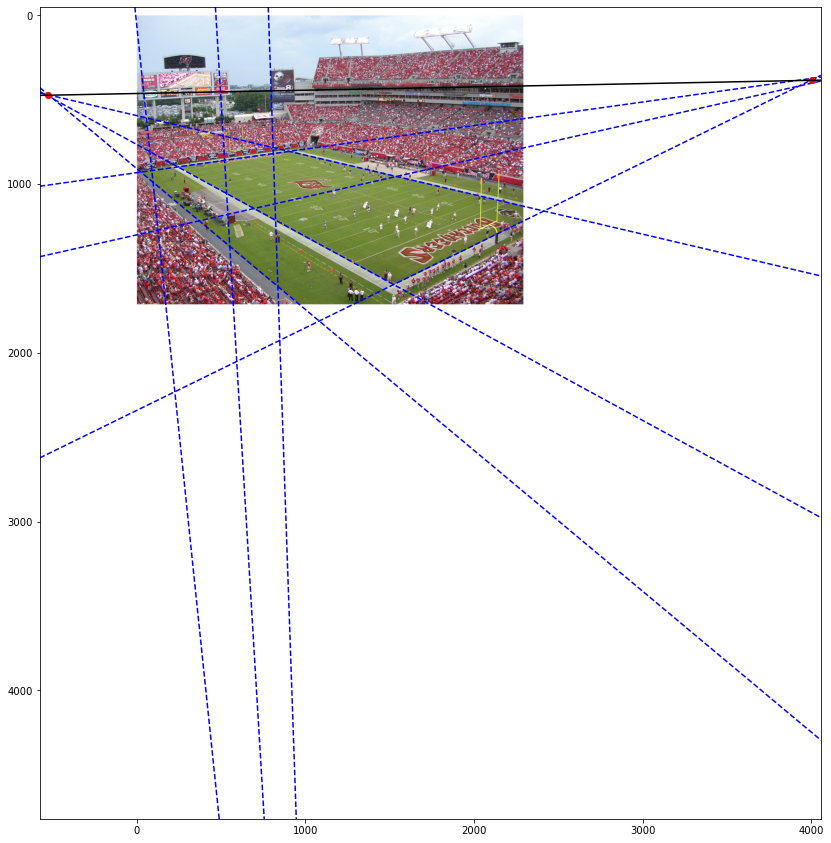

In [22]:
plt.figure(figsize=(14,50))
for i in range(points_np.shape[0]):
    for j in range(points_np.shape[1]):
        draw_line(points_np[i,j,:,0], points_np[i,j,:,1],xlims=[0- left_pad[1], new_img.shape[1]])

plt.plot(intersect_np[:,0],intersect_np[:,1], 'ro')
draw_line(intersect_np[:2,0],intersect_np[:2,1],xlims=[0- left_pad[1], new_img.shape[1]],c='k-')
plt.imshow(new_img,extent=[0- left_pad[1], new_img.shape[1]-left_pad[1], new_img.shape[0]- left_pad[0], 0 - left_pad[0]] )

## Answer to problem 6

It does match my intuitive notion of horizon. Among the region where you could see outside the stadium, you could see the split between sky and land

# Section 3: Homography

## Looking at the rectangle 

In [23]:
# Load the 4 corners in pixels and plot the points and use cv2.polylines to draw the polygon

im = np.asarray(Image.open('data/stadium.png'))
im = (im/255).astype(np.float32)
corners = []
with open('data/corners.txt','r') as inf:
    for line in inf:
        corners.append(eval(line))  
corners = corners[0]        

In [25]:
corners

{'LL': (282, 913), 'LR': (964, 816), 'UL': (1286, 1468), 'UR': (2198, 1107)}

In [26]:
# use a numpy array to store all the corner coordinates

corners_np = np.zeros([4,2])
for i,key in enumerate(corners):
    corners_np[i] = corners[key]

corners_np[[2,3],:] = corners_np[[3,2],:]

# LL - LR - UR - UL

In [28]:
pts = corners_np.astype(int)

isClosed = True
# Green color in BGR
color = (0, 1, 0)
  
# Line thickness of 8 px
thickness = 8
image = cv2.polylines(im, [pts], 
                      isClosed, color, 
                      thickness)

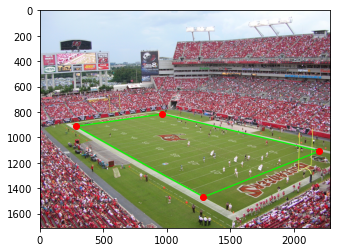

In [29]:
plt.plot(corners_np[:,0],corners_np[:,1], 'ro')
plt.imshow(image)

## Rectification 

corners

dist = np.linalg.norm(corners_np[0]-corners_np[-1])

dist

pixle_p_yard = 2*dist/100

pixle_p_yard

# LL - LR - UR - UL
new_corners_np = copy.deepcopy(corners_np)
new_corners_np[0] = [400,1200]
new_corners_np[1] = new_corners_np[0] + [53*pixle_p_yard, 0]
new_corners_np[2] = new_corners_np[0] + [53*pixle_p_yard, 100*pixle_p_yard]
new_corners_np[3] = new_corners_np[0] + [0,100*pixle_p_yard]

new_corners_np

M = cv2.getPerspectiveTransform(corners_np.astype(np.float32),new_corners_np.astype(np.float32))

M

rectified_image_1= cv2.warpPerspective(image,M,(4000,4000))

# Find the homography and rectify the rectangle

plt.figure(figsize=(20, 40))

plt.axis('off')
plt.subplot(121),plt.imshow(im),plt.title('Input')
plt.axis('off')
plt.subplot(122),plt.imshow(rectified_image_1),plt.title('Output')
plt.axis('off')
plt.show()

### Use eigendecomposition to find H

In [30]:
#construct a numpy array with new corner coordinate

dist = np.linalg.norm(corners_np[0]-corners_np[-1])

pixle_p_yard = 2*dist/100

pixle_p_yard

# LL - LR - UR - UL
new_corners_np = copy.deepcopy(corners_np)
new_corners_np[0] = [400,1200]
new_corners_np[1] = new_corners_np[0] + [53*pixle_p_yard, 0]
new_corners_np[2] = new_corners_np[0] + [53*pixle_p_yard, 100*pixle_p_yard]
new_corners_np[3] = new_corners_np[0] + [0,100*pixle_p_yard]

In [31]:
#construct matrix A

A  = np.zeros([8,9])
for i in range(0,A.shape[0],2):
    idx = i//2
    A[i] = [ corners_np[idx,0], corners_np[idx,1], 1, 0, 0, 0, -corners_np[idx,0]*new_corners_np[idx,0],\
             -corners_np[idx,1]*new_corners_np[idx,0], -new_corners_np[idx,0] ]
    A[i+1] = [0, 0, 0, corners_np[idx,0], corners_np[idx,1], 1, -corners_np[idx,0]*new_corners_np[idx,1],\
             -corners_np[idx,1]*new_corners_np[idx,1], -new_corners_np[idx,1] ]

In [32]:
u,s,vh = np.linalg.svd(A)



h = vh[-1,:]



h = h/h[-1]
h = h.reshape([3,3])



In [33]:
rectified_image_2= cv2.warpPerspective(im,h,(4000,4000))

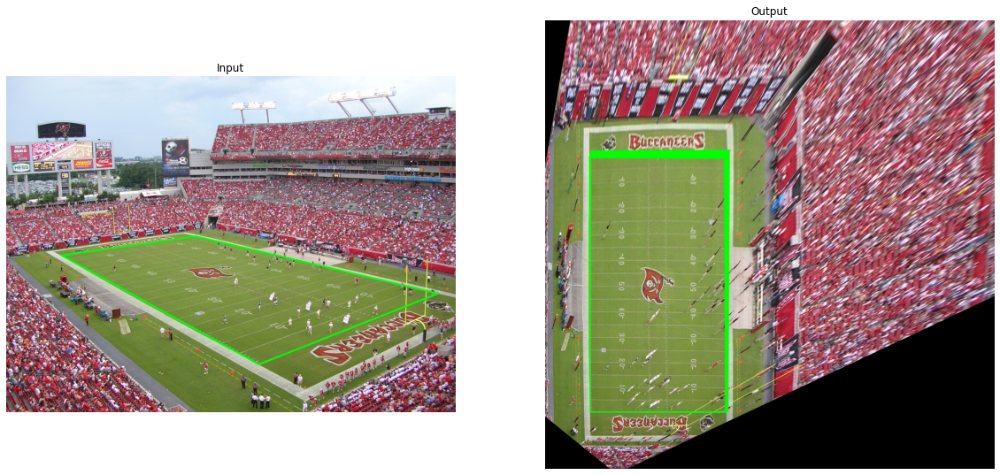

In [34]:
# Find the homography and rectify the rectangle

plt.figure(figsize=(20, 40))

plt.axis('off')
plt.subplot(121),plt.imshow(im),plt.title('Input')
plt.axis('off')
plt.subplot(122),plt.imshow(rectified_image_2),plt.title('Output')
plt.axis('off')
plt.show()


"""self implemented warp_perspective, not good"""

rectified_image_2 = np.ones([4000,4000,3],dtype=np.float32)

M2 = cv2.getPerspectiveTransform(corners_np.astype(np.float32),new_corners_np.astype(np.float32))
for i in range(im.shape[0]):
    for j in range(im.shape[1]):
        x = j
        y = i
        
        new_pos = M2.dot([x,y,1])
        new_pos = new_pos/new_pos[-1]
        new_x = new_pos[0]
        new_y = new_pos[1]
        
        
        if int(np.round(new_y)) >= rectified_image_2.shape[0] or int(np.round(new_x)) >= rectified_image_2.shape[1] or new_x <0 or new_y<0:
            continue
        else:
            rectified_image_2[int(np.round(new_y)),int(np.round(new_x))] = im[i,j]

plt.imshow(rectified_image_2)

## Measuring distances 

In [35]:


players = []
with open('data/players.txt','r') as inf:
    for line in inf:
        players.append(eval(line))  

players = players[0]

# Plot a few locations on the field, these are points of interest for the next problem
ref1_loc = players['ref1_loc']
ref2_loc = players['ref2_loc']
player_loc = players['player_loc']



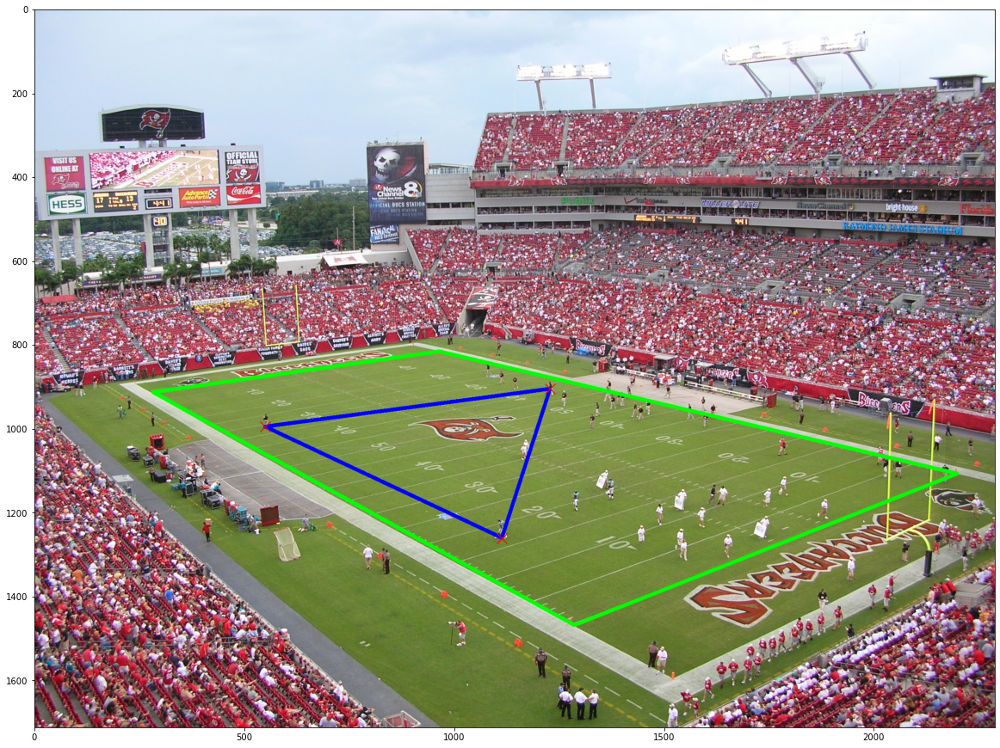

In [36]:
plt.figure(figsize=(20, 40))

plt.plot(ref1_loc[0],ref1_loc[1],'rx',markersize=12)
plt.plot(ref2_loc[0],ref2_loc[1],'rx',markersize=12)
plt.plot(player_loc[0],player_loc[1],'rx',markersize=12)

pts = np.array([ref1_loc,ref2_loc,player_loc]).astype(int)

isClosed = True
# Green color in BGR
color = (0, 0, 1)
  
# Line thickness of 8 px
thickness = 8
image = cv2.polylines(im, [pts], 
                      isClosed, color, 
                      thickness)
plt.imshow(im)

In [37]:
#construct a numpy array for new corners coordinate, but this time, with a ratio of 10 pixles = 1 yard

# LL - LR - UR - UL
new_corners_np_2 = copy.deepcopy(corners_np)
new_corners_np_2[0] = [0,0]
new_corners_np_2[1] = [530,0]
new_corners_np_2[2] = [530,1000]
new_corners_np_2[3] = [0,1000]

In [38]:
A_2  = np.zeros([8,9])
for i in range(0,A_2.shape[0],2):
    idx = i//2
    A_2[i] = [ corners_np[idx,0], corners_np[idx,1], 1, 0, 0, 0, -corners_np[idx,0]*new_corners_np_2[idx,0],\
             -corners_np[idx,1]*new_corners_np_2[idx,0], -new_corners_np_2[idx,0] ]
    A_2[i+1] = [0, 0, 0, corners_np[idx,0], corners_np[idx,1], 1, -corners_np[idx,0]*new_corners_np_2[idx,1],\
             -corners_np[idx,1]*new_corners_np_2[idx,1], -new_corners_np_2[idx,1] ]

In [39]:
u,s,vh = np.linalg.svd(A_2)

h_2 = vh[-1,:]

h_2 = h_2/h_2[-1]
h_2 = h_2.reshape([3,3])


In [40]:
rectified_image_3= cv2.warpPerspective(im,h_2,(4000,4000))

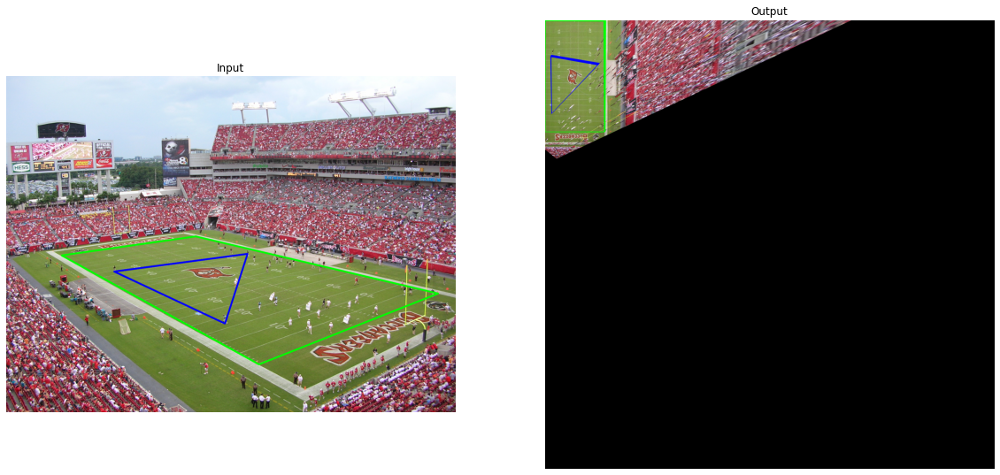

In [41]:
# Find the homography and rectify the rectangle

plt.figure(figsize=(20, 40))

plt.axis('off')
plt.subplot(121),plt.imshow(im),plt.title('Input')
plt.axis('off')
plt.subplot(122),plt.imshow(rectified_image_3),plt.title('Output')
plt.axis('off')
plt.show()

In [42]:
#construct a numpy array that store all the players' coordinate
player_loc_np = np.array([ref1_loc,ref2_loc,player_loc]).astype(int)

In [43]:
#convert the coordinate to homogeneous coordinate
player_loc_np = np.hstack([player_loc_np,np.ones([player_loc_np.shape[0],1])]).T

In [44]:
#transformed coordinate after h
new_player_loc_np = h_2.dot(player_loc_np)

In [45]:
new_player_loc_np /= new_player_loc_np[-1]

In [46]:
#convert from pixles to yards by 10:1 ratio
new_player_loc_np_yds = new_player_loc_np/10

### Position of players in yards

In [47]:
print("The position of ref1 is: {} yards.".format(new_player_loc_np_yds[:2,0]))
print("The position of ref2 is: {} yards.".format(new_player_loc_np_yds[:2,1]))
print("The position of player is: {} yards.".format(new_player_loc_np_yds[:2,2]))
# print("The distance between the player and ref1 is: {} yards.".format(result))

The position of ref1 is: [ 5.05646406 32.36091234] yards.
The position of ref2 is: [47.61251536 39.70861758] yards.
The position of player is: [ 5.77735971 83.68968388] yards.



### distance between players in yards

In [48]:
print("The distance between the player and ref1 is: {} yards."\
      .format( np.linalg.norm( new_player_loc_np_yds[:2,0] - new_player_loc_np_yds[:2,2]) ) )

print("The distance between the player and ref2 is: {} yards."\
      .format( np.linalg.norm( new_player_loc_np_yds[:2,1] - new_player_loc_np_yds[:2,2]) ) )


print("The distance between the ref1 and ref2 is: {} yards."\
      .format( np.linalg.norm( new_player_loc_np_yds[:2,0] - new_player_loc_np_yds[:2,1]) ) )


The distance between the player and ref1 is: 51.33383365313967 yards.
The distance between the player and ref2 is: 60.700201327308605 yards.
The distance between the ref1 and ref2 is: 43.18571840966766 yards.


### pixle position of field center

In [49]:
new_center_position = np.array([530/2,1000/2])
old_center_position = intersect_pts(corners_np[0:2,:],corners_np[2:4,:])

In [50]:
print("The pixle position of field center in the original image is at : {} .".format(old_center_position))
print("The pixle position of field center in the new image is at : {} .".format(new_center_position))

The pixle position of field center in the original image is at : [1050.32509918  990.79492132] .
The pixle position of field center in the new image is at : [265. 500.] .


## Problem 9

In [51]:
h_3 = np.linalg.inv(h_2)

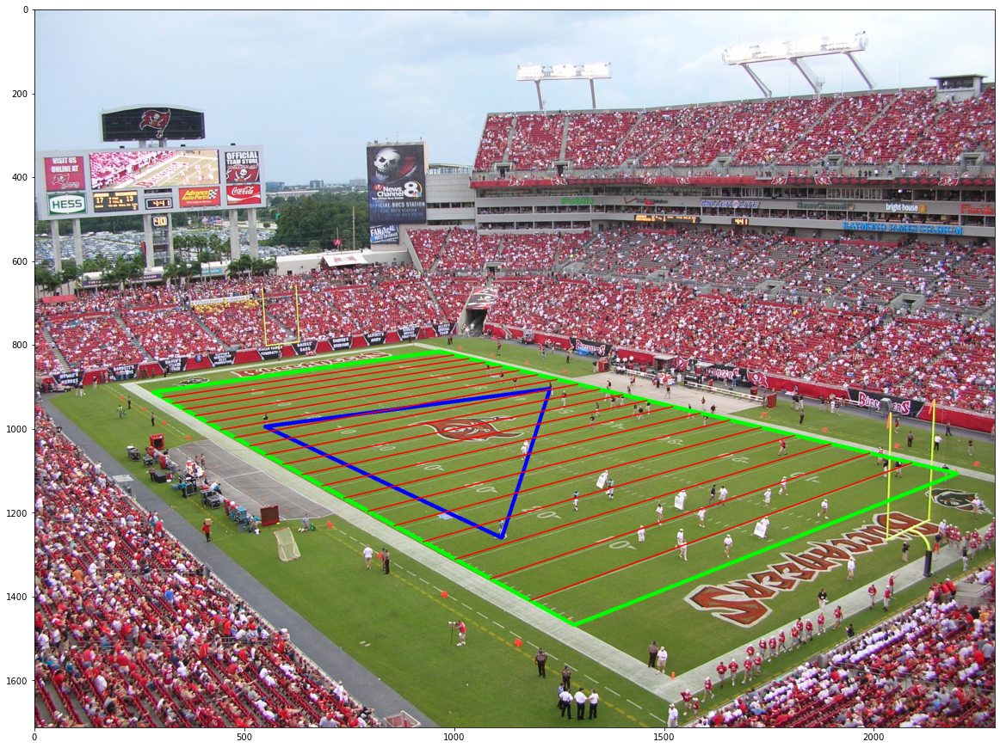

In [52]:
plt.figure(figsize=(20, 40))
for i in range(50,1000,50):
    start_pt = h_3.dot([0,i,1])
    start_pt/=start_pt[-1]
    end_pt = h_3.dot([530,i,1])
    end_pt /= end_pt[-1]
    draw_line([start_pt[0],end_pt[0]],[start_pt[1],end_pt[1]], xlims=[start_pt[0], end_pt[0]], c = 'r-')
plt.imshow(im)

# Section 4

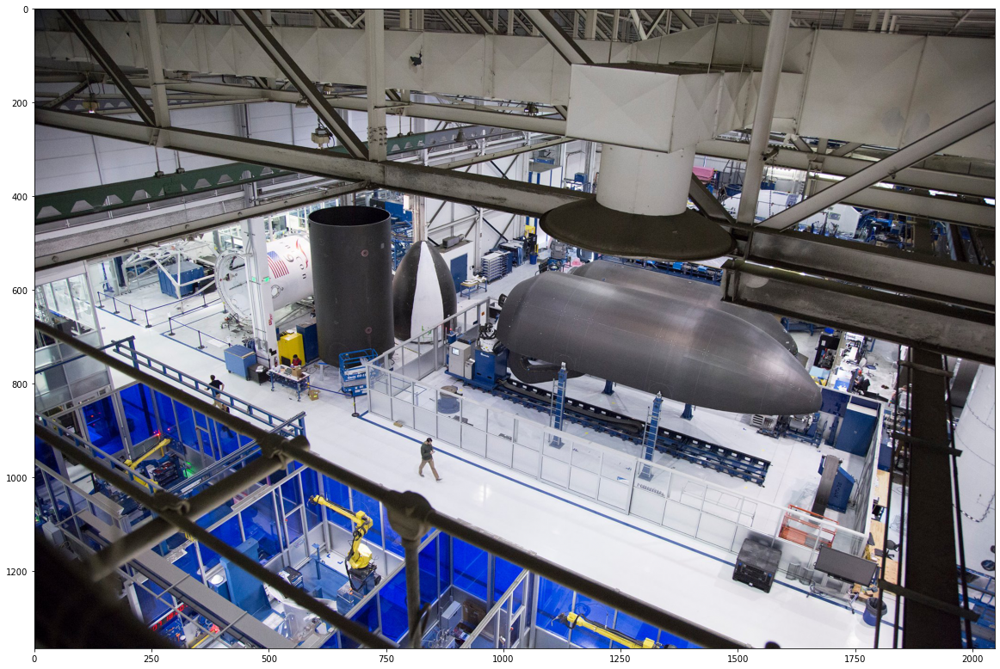

In [53]:
# interstage measurement from https://spaceflight101.com/spacerockets/falcon-9-ft/
from imageio import imread
plt.figure(figsize=(20, 40))

image = imread('data/composites.jpg')
image = image/ 255
plt.imshow(image)

points_dict = []
with open('data/spacex_factory.txt','r') as inf:
    for line in inf:
        points_dict.append(eval(line))  
        
points_dict = points_dict[0]


In [54]:
# 2 group * 3 lines * 2 points * 2 dimension

#construct a numpy array that stored all the points' coordinate
points_np = np.zeros([2,3,2,2])
for key in points_dict:
    if key.startswith('s'):
        num= int(key[1:])
        group_num = num//10
        line_num = num%10
        points_np[group_num-1,line_num-1,0] = points_dict[key]
        points_np[group_num-1,line_num-1,1] = points_dict['e'+key[1:]]
    else:
        continue
        
        

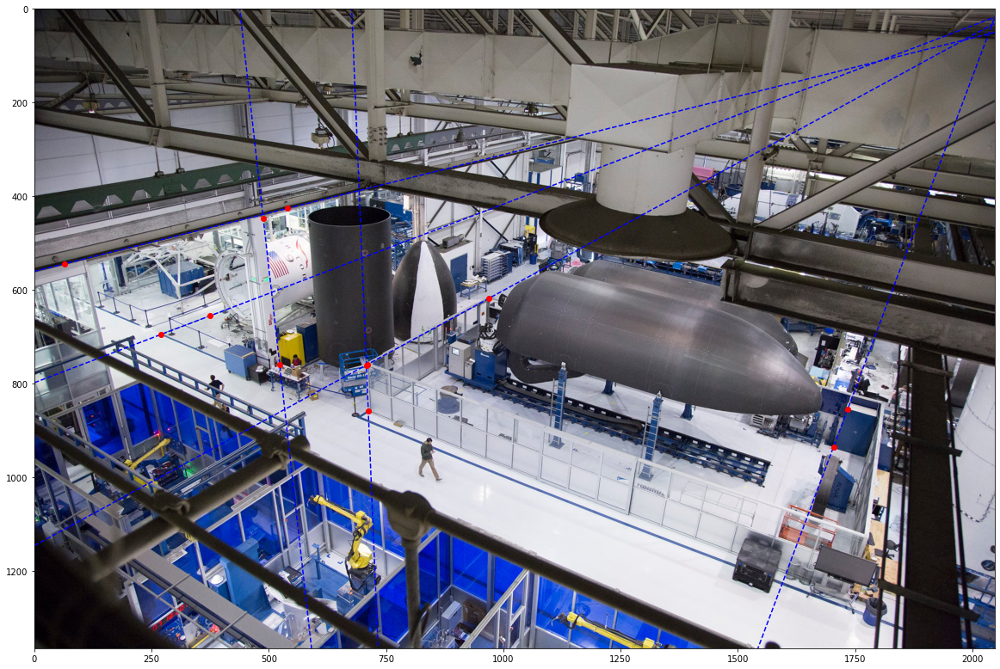

In [55]:
plt.figure(figsize=(20, 40))
for i in range(points_np.shape[0]):
    for j in range(points_np.shape[1]):
        draw_line(points_np[i,j,:,0], points_np[i,j,:,1],xlims=[0, im.shape[1]])
        plt.plot(points_np[i,j,:,0], points_np[i,j,:,1],'ro')
plt.imshow(image)

In [56]:
# a numpy array that store the coordinates of vanishing points
intersect_np = np.zeros([points_np.shape[0],2])

for i in range(intersect_np.shape[0]):
    intersect_np[i] = intersect(points_np[i,:,:,0],points_np[i,:,:,1])

In [57]:
#prepare for add tag space of the original image and plot the vanishing points

intersect_np_int = copy.deepcopy(intersect_np)
for i in range(intersect_np_int.shape[0]):
    for j in range(intersect_np_int.shape[1]):
    
        if intersect_np_int[i,j] <0:
            intersect_np_int[i,j] = np.floor(intersect_np_int[i,j])
        else:
            intersect_np_int[i,j] = np.ceil(intersect_np_int[i,j])

xy_min = np.flip(intersect_np_int.min(axis = 0))
xy_max = np.flip(intersect_np_int.max(axis = 0))

left_pad = copy.deepcopy(xy_min)
right_pad = copy.deepcopy(xy_max)

for i in range(left_pad.shape[0]):
    if left_pad[i] >= 0:
        left_pad[i] = 0
    else:
        left_pad[i] = - left_pad[i]
for j in range(right_pad.shape[0]):
    if right_pad[j] > image.shape[j]:
        right_pad[j] = -image.shape[j] + right_pad[j]
    else:
        right_pad[j] = 0

cutoff = 3000
right_pad = np.clip(right_pad,0,cutoff)
left_pad = np.clip(left_pad,0,cutoff)

right_pad += 50
left_pad += 50

right_pad=right_pad.astype(int)

left_pad=left_pad.astype(int)

In [58]:
new_img = np.pad(image,((left_pad[0],right_pad[0]),(left_pad[1],right_pad[1]),(0,0)), 'constant', constant_values=(1.))

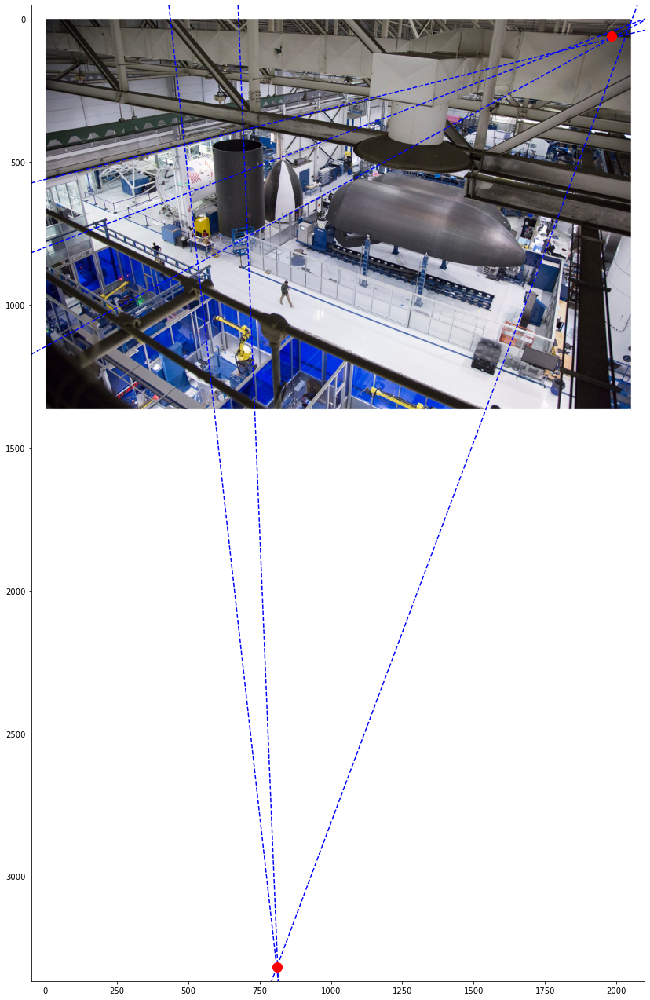

In [60]:
plt.figure(figsize=(14,50))
for i in range(points_np.shape[0]):
    for j in range(points_np.shape[1]):
        draw_line(points_np[i,j,:,0], points_np[i,j,:,1],xlims=[0- left_pad[1], new_img.shape[1]])

plt.plot(intersect_np[:,0],intersect_np[:,1], 'ro',markersize=12)        
plt.imshow(new_img,extent=[0- left_pad[1], new_img.shape[1]-left_pad[1], new_img.shape[0]- left_pad[0], 0 - left_pad[0]] )

In [61]:
# from imageio import imread
# plt.figure(figsize=(20, 40))

# image = imread('data/composites.jpg')
# plt.imshow(image)

# New stuff for this problem
metrology_points = []
with open('data/rocket_metrology.txt','r') as inf:
    for line in inf:
        metrology_points.append(eval(line))  
        
metrology_points = metrology_points[0]

reference_point = metrology_points['reference_point']
top_interstage = metrology_points['top_interstage']
top_nosecone = metrology_points['top_nosecone']
bottom_nosecone = metrology_points['bottom_nosecone']
bottom_interstage = metrology_points['bottom_interstage']

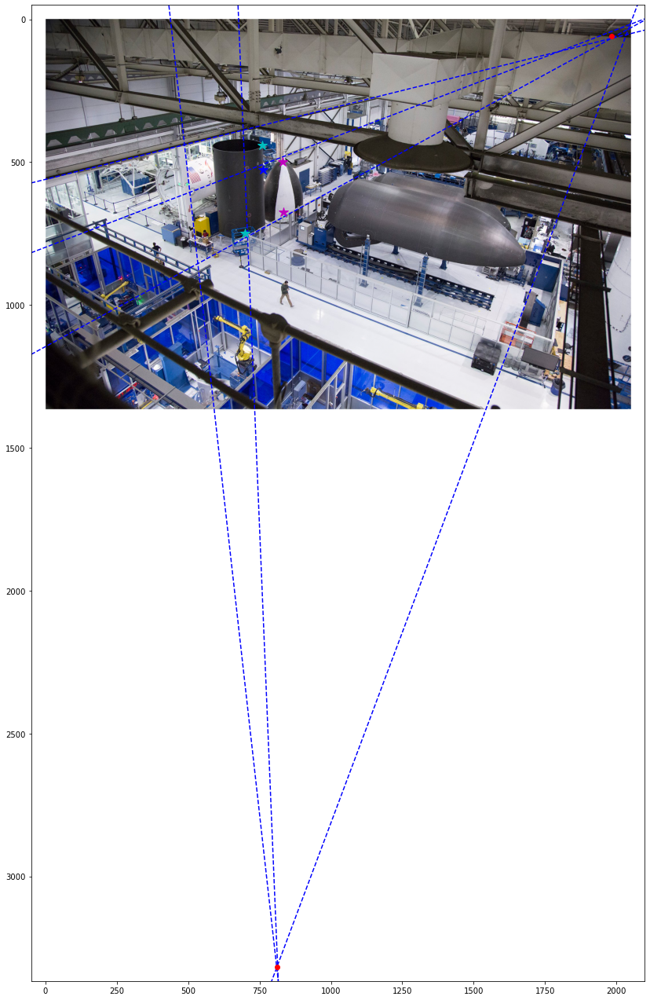

In [62]:
plt.figure(figsize=(14,50))
for i in range(points_np.shape[0]):
    for j in range(points_np.shape[1]):
        draw_line(points_np[i,j,:,0], points_np[i,j,:,1],xlims=[0- left_pad[1], new_img.shape[1]])

plt.plot(intersect_np[:,0],intersect_np[:,1], 'ro')        

plt.plot(reference_point[0],reference_point[1],'b*',markersize = 12)
plt.plot(top_interstage[0],top_interstage[1],'c*',markersize = 12)
plt.plot(top_nosecone[0],top_nosecone[1],'m*',markersize = 12)
plt.plot(bottom_nosecone[0],bottom_nosecone[1],'m*',markersize = 12)
plt.plot(bottom_interstage[0],bottom_interstage[1],'c*',markersize = 12)

plt.imshow(new_img,extent=[0- left_pad[1], new_img.shape[1]-left_pad[1], new_img.shape[0]- left_pad[0], 0 - left_pad[0]] )

In [63]:
def homogeneous(x, axis = -1):
    """
    convert to homogenous coordinate
    """
    x_ = np.array(x)
    ones_shape = list(x_.shape)
    ones_shape[axis] = 1
    
    return np.concatenate((x_,np.ones(ones_shape)),axis)


In [64]:
# coordinate of vanishing points
intersect_np

array([[1981.53761975,   58.78274499],
       [ 811.45069706, 3315.95706114]])

In [65]:
#horizon, line between vanishing points

horizon = np.cross(np.hstack((intersect_np[0],1)),np.hstack((intersect_np[1],1)))

In [66]:
#coordinate of bottom interstage that is directly below top_interstage
ground_stage = np.cross( np.cross(homogeneous(bottom_interstage), homogeneous(bottom_nosecone))    , \
                        np.cross( homogeneous(top_interstage), homogeneous(reference_point)  )     )

In [67]:
#line through bottom_interstage, bottom_nosecone
bb = np.cross(homogeneous(bottom_interstage),homogeneous(bottom_nosecone))

In [68]:
#intersect between line(interstage,nosecone) and horizon
bb_hori = np.cross(bb,horizon)

In [69]:
#projection of top of nosecone to interstage
proj_nose_on_stage = np.cross( np.cross(bb_hori,homogeneous(top_nosecone)) , \
                              np.cross(homogeneous(top_interstage), homogeneous(reference_point) )   )

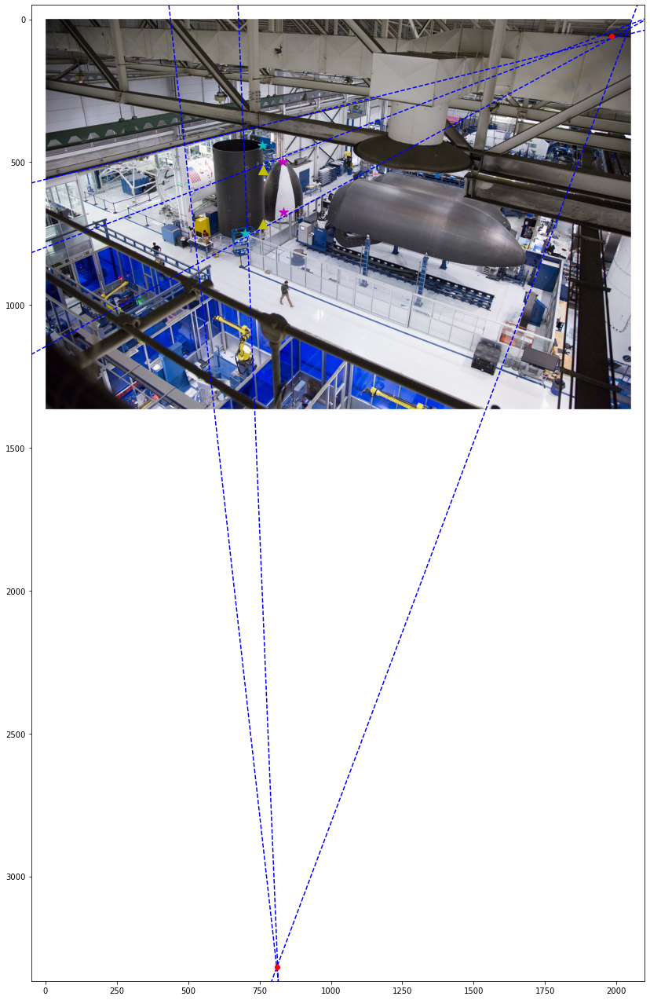

In [70]:
#plot of project of nosecone top at interstage, and ground points
#in yellow triangle

plt.figure(figsize=(14,50))
for i in range(points_np.shape[0]):
    for j in range(points_np.shape[1]):
        draw_line(points_np[i,j,:,0], points_np[i,j,:,1],xlims=[0- left_pad[1], new_img.shape[1]])

plt.plot(intersect_np[:,0],intersect_np[:,1], 'ro')        

plt.plot(reference_point[0],reference_point[1],'b*',markersize = 12)
plt.plot(top_interstage[0],top_interstage[1],'c*',markersize = 12)
plt.plot(top_nosecone[0],top_nosecone[1],'m*',markersize = 12)
plt.plot(bottom_nosecone[0],bottom_nosecone[1],'m*',markersize = 12)
plt.plot(bottom_interstage[0],bottom_interstage[1],'c*',markersize = 12)

plt.plot(ground_stage[0]/ground_stage[2],ground_stage[1]/ground_stage[2], 'y^',markersize=12)
plt.plot(proj_nose_on_stage[0]/proj_nose_on_stage[2],proj_nose_on_stage[1]/proj_nose_on_stage[2], 'y^',markersize=12)

plt.imshow(new_img,extent=[0- left_pad[1], new_img.shape[1]-left_pad[1], new_img.shape[0]- left_pad[0], 0 - left_pad[0]] )

In [71]:
def cross_ratio(t, b, r, v_z):
    return (np.linalg.norm(t-b)*np.linalg.norm(v_z-r)) / (np.linalg.norm(r-b)*np.linalg.norm(v_z -t))

In [72]:
cr = cross_ratio(proj_nose_on_stage/proj_nose_on_stage[-1],ground_stage/ground_stage[-1],\
                 homogeneous(top_interstage),homogeneous(intersect_np[1]))

In [73]:
H = 4.4*cr
print("The estimated height of the nosecone is: {} meters.".format(H))

The estimated height of the nosecone is: 3.115226587136319 meters.


I believe the actual height of the nosecone should be larger than the number estimated above as the coordinate of the bottom of the nosecone seems not quite accurate from the plot.